In [1]:
import os
import random
import numpy as np
from tqdm import tqdm
from IPython.display import HTML

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as animation
matplotlib.rcParams['figure.figsize'] = [5, 5]
matplotlib.rcParams['figure.dpi'] = 200

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn import init

import torchvision
import torchvision.transforms as transforms
import torchvision.utils as vutils

from data_helper import UnlabeledDataset, LabeledDataset
from helper import collate_fn, draw_box

In [2]:
random.seed(0)
np.random.seed(0)
torch.manual_seed(0);

In [3]:
device = ("cuda:0" if torch.cuda.is_available() else "cpu")
device

'cuda:0'

### Set Initial Parameters

In [4]:
batch_size = 8

### Create Dataset and Dataloader

In [5]:
data_dir = '/home/alexander/DL/data'
annotation_csv = '/home/alexander/DL/data/annotation.csv'

# You shouldn't change the unlabeled_scene_index
# The first 106 scenes are unlabeled
unlabeled_scene_index = np.arange(106)
# The scenes from 106 - 133 are labeled
# You should devide the labeled_scene_index into two subsets (training and validation)
labeled_scene_index = np.arange(106, 134)

In [6]:
transform = torchvision.transforms.ToTensor()

# unlabeled_trainset = UnlabeledDataset(image_folder=image_folder, scene_index=labeled_scene_index, first_dim='sample', transform=transform)
# trainloader = torch.utils.data.DataLoader(unlabeled_trainset, batch_size=3, shuffle=True, num_workers=2)

In [7]:
labeled_trainset = LabeledDataset(image_folder=data_dir,
                                  annotation_file=annotation_csv,
                                  scene_index=labeled_scene_index,
#                                   img_transform = transforms.ToTensor(),
#                                   map_transform = None,
                                  img_transform=transforms.Compose([transforms.CenterCrop(256),
                                                                    transforms.ToTensor(),
                                                                    transforms.Normalize(mean=(0.5,), std=(0.5,))
                                                                   ]),
                                  map_transform=transforms.Compose([transforms.ToPILImage(),
                                                                    transforms.Resize(256),
                                                                    transforms.ToTensor()
                                                                   ]),
                                  extra_info=True
                                 )

trainloader = torch.utils.data.DataLoader(labeled_trainset,
                                          batch_size=batch_size,
                                          shuffle=True,
                                          num_workers=2,
                                          collate_fn=collate_fn)

In [8]:
labeled_trainset[1][0].size()

torch.Size([18, 256, 256])

In [9]:
for images, road_maps in trainloader:
    print(images.size())
    break

# # sample, target, road_image, extra = iter(trainloader).next()
# # print(len(sample[0]))
# # # print(torch.stack(sample).shape)
# # print(road_image[0].size())

torch.Size([8, 18, 256, 256])


In [10]:
# print(road_image[0])

In [11]:
# # The 6 images orgenized in the following order:
# # CAM_FRONT_LEFT, CAM_FRONT, CAM_FRONT_RIGHT, CAM_BACK_LEFT, CAM_BACK, CAM_BACK_RIGHT
# plt.imshow(torchvision.utils.make_grid(sample[4], nrow=3).numpy().transpose(1, 2, 0))
# plt.axis('off');

In [12]:
# # The road map layout is encoded into a binary array of size [800, 800] per sample 
# # Each pixel is 0.1 meter in physiscal space, so 800 * 800 is 80m * 80m centered at the ego car
# # The ego car is located in the center of the map (400, 400) and it is always facing the left

# fig, ax = plt.subplots()
# ax.imshow(road_image[4][0], cmap='binary');

### Define models

In [13]:
class ResnetBlock(nn.Module):
    """
    Define a Resnet block
    A resnet block is a conv block with skip connections
    Original Resnet paper: https://arxiv.org/pdf/1512.03385.pdf
    """
    def __init__(self, dim):
        """
        Parameters:
            dim (int)           -- the number of channels in the conv layer.
            padding_type (str)  -- the name of padding layer: reflect | replicate | zero
            use_dropout (bool)  -- if use dropout layers.
            use_bias (bool)     -- if the conv layer uses bias or not
        """
        super(ResnetBlock, self).__init__()
        self.resnet_block = nn.Sequential(nn.Conv2d(dim, dim, kernel_size=3, padding=1),
                                          nn.BatchNorm2d(dim),
                                          nn.ReLU(True),
                                          nn.Dropout(0.5),
                                          nn.Conv2d(dim, dim, kernel_size=3, padding=1),
                                          nn.BatchNorm2d(dim)
                                         )
        
    def forward(self, x):
        return x + self.resnet_block(x)  # add skip connections

In [14]:
class Generator(nn.Module):
    """
    RESNET-based generator that consists of Resnet blocks + downsampling/upsampling operations.
    """
    def __init__(self, in_ch, out_ch, ngf, n_blocks=6, init_gain=0.02):
        """
        Parameters:
            in_ch (int)         -- the number of channels in input images
            out_ch (int)        -- the number of channels in output images
            ngf (int)           -- the number of filters in the last conv layer
            n_blocks (int)      -- the number of ResNet blocks
            padding_type (str)  -- the name of padding layer in conv layers: reflect | replicate | zero
        """        
        assert(n_blocks >= 0)
        super(Generator, self).__init__()
        
        self.model = nn.Sequential(
            nn.ReflectionPad2d(3),
            
            nn.Conv2d(in_ch, ngf, kernel_size=7, padding=0),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            
            nn.Conv2d(ngf, ngf * 2, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            
            nn.Conv2d(ngf * 2, ngf * 4, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            
            ResnetBlock(ngf * 4),  #1
            ResnetBlock(ngf * 4),  #2
            ResnetBlock(ngf * 4),  #3
            ResnetBlock(ngf * 4),  #4
            ResnetBlock(ngf * 4),  #5
            ResnetBlock(ngf * 4),  #6
            ResnetBlock(ngf * 4),  #7
            ResnetBlock(ngf * 4),  #8
            ResnetBlock(ngf * 4),  #9

            nn.ConvTranspose2d(ngf * 4, int(ngf * 2), kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(int(ngf * 2)),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(ngf * 2, int(ngf), kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(int(ngf)),
            nn.ReLU(True),

            nn.ReflectionPad2d(3),
            nn.Conv2d(ngf, out_ch, kernel_size=7, padding=0),
            nn.Tanh()
        )
        
    def forward(self, x):
        return self.model(x)

In [15]:
class Discriminator(nn.Module):
    def __init__(self, in_ch, ndf=64, n_layers=3):  
        super(Discriminator, self).__init__()
        
        self.block1 = nn.Sequential(nn.Conv2d(in_ch, ndf, kernel_size=4, stride=2, padding=1),
                                    nn.LeakyReLU(0.2, True)
                                   )
        
        nf_mult = 1
        nf_mult_prev = 1
        sequence2 = []        
        for n in range(1, n_layers):  # gradually increase the number of filters
            nf_mult_prev = nf_mult
            nf_mult = min(2 ** n, 8)
            sequence2 += [nn.Conv2d(ndf * nf_mult_prev, ndf * nf_mult, kernel_size=4, stride=2, padding=1),
                         nn.BatchNorm2d(ndf * nf_mult),
                         nn.LeakyReLU(0.2, True)
                         ]
        self.block2 = nn.Sequential(*sequence2)
        
        sequence3 = []
        nf_mult_prev = nf_mult
        nf_mult = min(2 ** n_layers, 8)
        sequence3 += [nn.Conv2d(ndf * nf_mult_prev, ndf * nf_mult, kernel_size=4, stride=1, padding=1),
                     nn.BatchNorm2d(ndf * nf_mult),
                     nn.LeakyReLU(0.2, True)
                     ]
        self.block3 = nn.Sequential(*sequence3)
        
        self.model = nn.Sequential(self.block1,
                                   self.block2,
                                   self.block3,
                                   nn.Conv2d(ndf * nf_mult, 1, kernel_size=4, stride=1, padding=1)
                                  )
        
    def forward(self, x):
        return self.model(x)

In [16]:
in_ch = 18
out_ch = 1
ngf = 64
ndf = 64
n_blocks_g = 9
n_layers_d = 3

n_epochs = 100
lr_g = 0.0001
lr_d = 0.0004
beta1 = 0.5
beta2 = 0.999
L1_lambda = 100

real_label = 0.9
gen_label = 0.0

In [17]:
# Sanity check - dimensions of inputs and outputs to both networks.

test = torch.zeros([1, 18, 256, 256])
print("Input to generator:\t", test.size())

test_generator = Generator(in_ch, out_ch, ngf, n_blocks=n_blocks_g, init_gain=0.02)
test_result_g = test_generator(test)
print("\nOutput of generator:\t", test_result_g.size())

test_d_input = torch.cat((test_result_g, test), 1)
print("\nInput to discriminator:\t", test_d_input.size())

test_discriminator = Discriminator(in_ch + out_ch, ndf=ndf, n_layers=n_layers_d)
test_result_d = test_discriminator(test_d_input)
print("\nOutput of discriminator:", test_result_d.size())

Input to generator:	 torch.Size([1, 18, 256, 256])

Output of generator:	 torch.Size([1, 1, 256, 256])

Input to discriminator:	 torch.Size([1, 19, 256, 256])

Output of discriminator: torch.Size([1, 1, 30, 30])


In [18]:
class GANLoss(nn.Module):
    """
    The GANLoss class abstracts away the need to create the target label tensor
    that has the same size as the input.
    """
    def __init__(self, gan_mode, real_label=1.0, gen_label=0.0):
        """
        Parameters:
            gan_mode (str) - - the type of GAN objective. It currently supports vanilla, lsgan, and wgangp.
            target_real_label (bool) - - label for a real image
            target_gen_label (bool) - - label of a generated image
        Note: Do not use sigmoid as the last layer of Discriminator.
        LSGAN needs no sigmoid. vanilla GANs will handle it with BCEWithLogitsLoss.
        """
        super(GANLoss, self).__init__()
        
        self.gan_mode = gan_mode
        self.real_label = real_label
        self.gen_label = gen_label
        
        if gan_mode == 'LS':
            self.loss = nn.MSELoss().to(device)
        elif gan_mode == 'BCE':
            self.loss = nn.BCEWithLogitsLoss().to(device)

    def get_target_tensor(self, output, target_is_real):
        # Create label tensors with same size as the discriminator output.
        if target_is_real:
            if "cuda" in device:
                target_tensor = torch.cuda.FloatTensor([self.real_label])
            else:
                target_tensor = torch.Tensor([self.real_label])
        else:
            if "cuda" in device:
                target_tensor = torch.cuda.FloatTensor([self.gen_label])
            else:
                target_tensor = torch.Tensor([self.gen_label])
                
        return target_tensor.expand_as(output)

    def __call__(self, output, target_is_real):
        target_tensor = self.get_target_tensor(output, target_is_real)
        loss = self.loss(output, target_tensor)
        return loss

In [19]:
def init_weights(m):  # define the initialization function
    classname = m.__class__.__name__
    if hasattr(m, 'weight') and (classname.find('Conv') != -1 or classname.find('Linear') != -1):
        init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm2d') != -1:  # BatchNorm Layer's weight is not a matrix; only normal distribution applies.
        init.normal_(m.weight.data, 1.0, 0.02)
        init.constant_(m.bias.data, 0.0)

In [20]:
generator = Generator(in_ch, out_ch, ngf, n_blocks=n_blocks_g, init_gain=0.02).to(device)
discriminator = Discriminator(in_ch + out_ch, ndf=ndf, n_layers=n_layers_d).to(device)

generator.apply(init_weights)
discriminator.apply(init_weights)

generator.train()
discriminator.train()

Discriminator(
  (block1): Sequential(
    (0): Conv2d(19, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (block2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (block3): Sequential(
    (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (model): Sequential(
    (0): Sequential(
      (0): Conv2d(19, 64, kernel_size=(4, 4), stride=(2, 2), padding=(

In [21]:
# We combine GAN Loss and L1 Loss to attain Total Loss
criterion_gan = GANLoss('BCE', real_label=real_label, gen_label=gen_label).to(device)
criterion_L1 = nn.L1Loss().to(device)

optim_G = torch.optim.Adam(generator.parameters(), lr=lr_g, betas=(beta1, beta2))
optim_D = torch.optim.Adam(discriminator.parameters(), lr=lr_d, betas=(beta1, beta2))

### Train

In [22]:
iters = 0
update_stats_rate = 50
losses_g = []
losses_d = []
intermediate_images = []

In [23]:
####################################
########## TRAINING LOOP ###########
####################################
for epoch in range(n_epochs):
    i = 1
    for real_18ch, real_map in tqdm(trainloader):
        """
        TRAIN DISCRIMINATOR ON REAL AND GENERATED SAMPLES
        """
        real_18ch = real_18ch.to(device)
        real_map = real_map.to(device)
        
        gen_map = generator(real_18ch)
        
        real_19ch = torch.cat((real_18ch, real_map), 1).to(device)
        gen_19ch = torch.cat((real_18ch, gen_map), 1).to(device)

        output_real = discriminator(real_19ch)
        output_gen = discriminator(gen_19ch.detach())
        
        d_real_mean = output_real.mean().item()
        d_gen_mean_pre = output_gen.mean().item()

        # Make label tensors.
        target_real = torch.Tensor([real_label]).expand_as(output_real).to(device)
        target_gen = torch.Tensor([gen_label]).expand_as(output_gen).to(device)

        # Compute loss.
#         loss_d_real = criterion_gan(output_real, target_is_real=True) + L1_lambda * criterion_L1(real_map, real_map)
#         loss_d_gen = criterion_gan(output_gen, target_is_real=False) + L1_lambda * criterion_L1(gen_map, real_map)
#         loss_d_total = (loss_d_real + loss_d_gen)

        loss_d_real = criterion_gan(output_real, target_is_real=True)
        loss_d_gen = criterion_gan(output_gen, target_is_real=False)
        loss_d_total = (loss_d_real + loss_d_gen)  
    
        discriminator.zero_grad()
        loss_d_total.backward()
        optim_D.step()
        
        """
        TRAIN GENERATOR
        """
        output_gen = discriminator(gen_19ch)
        target_real = torch.Tensor([real_label]).expand_as(output_real).to(device)
#         loss_g = criterion_gan(output_gen, target_is_real=True) + criterion_L1(output_gen, target_real)
        loss_g = criterion_gan(output_gen, target_is_real=True)
        d_gen_mean_post = output_gen.mean().item()
        
        generator.zero_grad()
        loss_g.backward()
        optim_G.step()
        
        """
        COMPILE TRAINING STATISTICS
        """
        losses_d.append(loss_d_total)
        losses_g.append(loss_g)
        
        # Print out training stats
        if i % update_stats_rate == 1:
            print('Epoch: [%d/%d]\tBatch: [%d/%d]\nLoss_D: %.4f\tLoss_G: %.4f\nD(real): %.4f  ||  D(gen) Pre-G-step: %.4f  ||  D(gen) Post-G-step: %.4f'
                  % (epoch + 1, n_epochs,
                     i, len(trainloader),
                     loss_d_total.item(), loss_g.item(),
                     d_real_mean, d_gen_mean_pre, d_gen_mean_post))
        
        # Append current generated image to list of intermediate images to view post training
        if (iters % update_stats_rate == 0) or epoch == n_epochs-1:
            with torch.no_grad():
                output_gen = generator(real_18ch).detach().cpu()
            intermediate_images.append(vutils.make_grid(output_gen, padding=2, normalize=True))
        
        i += 1
        iters += 1
        

  0%|          | 1/441 [00:01<12:32,  1.71s/it]

Epoch: [1/100]	Batch: [1/441]
Loss_D: 1.6059	Loss_G: 2.3400
D(real): -0.2425  ||  D(gen) Pre-G-step: -0.2395  ||  D(gen) Post-G-step: -0.1869


 12%|█▏        | 51/441 [00:22<03:12,  2.03it/s]

Epoch: [1/100]	Batch: [51/441]
Loss_D: 1.5039	Loss_G: 0.8803
D(real): -0.2010  ||  D(gen) Pre-G-step: -0.1977  ||  D(gen) Post-G-step: -0.2602


 23%|██▎       | 101/441 [00:43<02:48,  2.02it/s]

Epoch: [1/100]	Batch: [101/441]
Loss_D: 1.3843	Loss_G: 0.7828
D(real): -0.2083  ||  D(gen) Pre-G-step: -0.2092  ||  D(gen) Post-G-step: -0.2022


 34%|███▍      | 151/441 [01:04<02:23,  2.03it/s]

Epoch: [1/100]	Batch: [151/441]
Loss_D: 1.3999	Loss_G: 0.8124
D(real): -0.1829  ||  D(gen) Pre-G-step: -0.1802  ||  D(gen) Post-G-step: -0.2405


 46%|████▌     | 201/441 [01:25<01:59,  2.02it/s]

Epoch: [1/100]	Batch: [201/441]
Loss_D: 1.3983	Loss_G: 0.8048
D(real): -0.1965  ||  D(gen) Pre-G-step: -0.1948  ||  D(gen) Post-G-step: -0.2185


 57%|█████▋    | 251/441 [01:46<01:33,  2.04it/s]

Epoch: [1/100]	Batch: [251/441]
Loss_D: 1.3916	Loss_G: 0.7817
D(real): -0.2163  ||  D(gen) Pre-G-step: -0.2167  ||  D(gen) Post-G-step: -0.1918


 68%|██████▊   | 301/441 [02:07<01:09,  2.01it/s]

Epoch: [1/100]	Batch: [301/441]
Loss_D: 1.3815	Loss_G: 0.7802
D(real): -0.2030  ||  D(gen) Pre-G-step: -0.2031  ||  D(gen) Post-G-step: -0.1987


 80%|███████▉  | 351/441 [02:28<00:44,  2.01it/s]

Epoch: [1/100]	Batch: [351/441]
Loss_D: 1.3791	Loss_G: 0.7810
D(real): -0.2126  ||  D(gen) Pre-G-step: -0.2127  ||  D(gen) Post-G-step: -0.2011


 91%|█████████ | 401/441 [02:50<00:19,  2.02it/s]

Epoch: [1/100]	Batch: [401/441]
Loss_D: 1.3820	Loss_G: 0.7802
D(real): -0.2086  ||  D(gen) Pre-G-step: -0.2082  ||  D(gen) Post-G-step: -0.1973


  0%|          | 1/441 [00:01<08:07,  1.11s/it]

Epoch: [2/100]	Batch: [1/441]
Loss_D: 1.3784	Loss_G: 0.7805
D(real): -0.1998  ||  D(gen) Pre-G-step: -0.2013  ||  D(gen) Post-G-step: -0.2021


 12%|█▏        | 51/441 [00:22<02:56,  2.21it/s]

Epoch: [2/100]	Batch: [51/441]
Loss_D: 1.3962	Loss_G: 0.7908
D(real): -0.2168  ||  D(gen) Pre-G-step: -0.2182  ||  D(gen) Post-G-step: -0.1971


 23%|██▎       | 101/441 [00:43<02:34,  2.20it/s]

Epoch: [2/100]	Batch: [101/441]
Loss_D: 1.3963	Loss_G: 0.8482
D(real): -0.1380  ||  D(gen) Pre-G-step: -0.1468  ||  D(gen) Post-G-step: -0.3146


 34%|███▍      | 151/441 [01:04<02:12,  2.19it/s]

Epoch: [2/100]	Batch: [151/441]
Loss_D: 1.3821	Loss_G: 0.7758
D(real): -0.2315  ||  D(gen) Pre-G-step: -0.2310  ||  D(gen) Post-G-step: -0.1876


 46%|████▌     | 201/441 [01:25<01:49,  2.20it/s]

Epoch: [2/100]	Batch: [201/441]
Loss_D: 1.3795	Loss_G: 0.7852
D(real): -0.2054  ||  D(gen) Pre-G-step: -0.2152  ||  D(gen) Post-G-step: -0.2089


 57%|█████▋    | 251/441 [01:46<01:26,  2.19it/s]

Epoch: [2/100]	Batch: [251/441]
Loss_D: 1.3764	Loss_G: 0.7863
D(real): -0.1644  ||  D(gen) Pre-G-step: -0.1836  ||  D(gen) Post-G-step: -0.2108


 68%|██████▊   | 301/441 [02:07<01:03,  2.21it/s]

Epoch: [2/100]	Batch: [301/441]
Loss_D: 1.3971	Loss_G: 0.8276
D(real): -0.1844  ||  D(gen) Pre-G-step: -0.1979  ||  D(gen) Post-G-step: -0.2741


 80%|███████▉  | 351/441 [02:28<00:40,  2.21it/s]

Epoch: [2/100]	Batch: [351/441]
Loss_D: 1.3921	Loss_G: 0.7924
D(real): -0.1781  ||  D(gen) Pre-G-step: -0.1857  ||  D(gen) Post-G-step: -0.2194


 91%|█████████ | 401/441 [02:49<00:18,  2.19it/s]

Epoch: [2/100]	Batch: [401/441]
Loss_D: 1.4194	Loss_G: 0.8196
D(real): -0.0800  ||  D(gen) Pre-G-step: -0.0872  ||  D(gen) Post-G-step: -0.2479


  0%|          | 1/441 [00:01<08:01,  1.09s/it]

Epoch: [3/100]	Batch: [1/441]
Loss_D: 1.3759	Loss_G: 0.8061
D(real): -0.1575  ||  D(gen) Pre-G-step: -0.1845  ||  D(gen) Post-G-step: -0.2524


 12%|█▏        | 51/441 [00:22<02:55,  2.22it/s]

Epoch: [3/100]	Batch: [51/441]
Loss_D: 1.3718	Loss_G: 0.8101
D(real): -0.1355  ||  D(gen) Pre-G-step: -0.1708  ||  D(gen) Post-G-step: -0.2621


 23%|██▎       | 101/441 [00:43<02:33,  2.21it/s]

Epoch: [3/100]	Batch: [101/441]
Loss_D: 1.3444	Loss_G: 0.8023
D(real): -0.1888  ||  D(gen) Pre-G-step: -0.2778  ||  D(gen) Post-G-step: -0.2456


 34%|███▍      | 151/441 [01:04<02:12,  2.19it/s]

Epoch: [3/100]	Batch: [151/441]
Loss_D: 1.3645	Loss_G: 0.8260
D(real): -0.2505  ||  D(gen) Pre-G-step: -0.3654  ||  D(gen) Post-G-step: -0.2561


 46%|████▌     | 201/441 [01:25<01:48,  2.22it/s]

Epoch: [3/100]	Batch: [201/441]
Loss_D: 1.4279	Loss_G: 0.8998
D(real): -0.1078  ||  D(gen) Pre-G-step: -0.2503  ||  D(gen) Post-G-step: -0.2846


 57%|█████▋    | 251/441 [01:46<01:26,  2.21it/s]

Epoch: [3/100]	Batch: [251/441]
Loss_D: 1.2996	Loss_G: 0.8219
D(real): -0.1424  ||  D(gen) Pre-G-step: -0.3635  ||  D(gen) Post-G-step: -0.2729


 68%|██████▊   | 301/441 [02:07<01:02,  2.23it/s]

Epoch: [3/100]	Batch: [301/441]
Loss_D: 1.1245	Loss_G: 1.1613
D(real): 0.2923  ||  D(gen) Pre-G-step: -0.4196  ||  D(gen) Post-G-step: -0.8879


 80%|███████▉  | 351/441 [02:28<00:41,  2.19it/s]

Epoch: [3/100]	Batch: [351/441]
Loss_D: 0.8882	Loss_G: 1.3363
D(real): 0.3155  ||  D(gen) Pre-G-step: -1.3200  ||  D(gen) Post-G-step: -1.1610


 91%|█████████ | 401/441 [02:48<00:17,  2.22it/s]

Epoch: [3/100]	Batch: [401/441]
Loss_D: 1.0044	Loss_G: 1.1304
D(real): 0.3534  ||  D(gen) Pre-G-step: -0.9178  ||  D(gen) Post-G-step: -0.7761


  0%|          | 1/441 [00:01<08:05,  1.10s/it]

Epoch: [4/100]	Batch: [1/441]
Loss_D: 0.7851	Loss_G: 1.3280
D(real): 0.5290  ||  D(gen) Pre-G-step: -1.8087  ||  D(gen) Post-G-step: -1.1143


 12%|█▏        | 51/441 [00:22<02:57,  2.20it/s]

Epoch: [4/100]	Batch: [51/441]
Loss_D: 0.7630	Loss_G: 1.4787
D(real): 0.8509  ||  D(gen) Pre-G-step: -1.3758  ||  D(gen) Post-G-step: -1.3299


 23%|██▎       | 101/441 [00:43<02:33,  2.21it/s]

Epoch: [4/100]	Batch: [101/441]
Loss_D: 0.8432	Loss_G: 1.6673
D(real): 1.2897  ||  D(gen) Pre-G-step: -1.2829  ||  D(gen) Post-G-step: -1.6162


 34%|███▍      | 151/441 [01:04<02:10,  2.22it/s]

Epoch: [4/100]	Batch: [151/441]
Loss_D: 0.6931	Loss_G: 1.3310
D(real): 0.5876  ||  D(gen) Pre-G-step: -1.9210  ||  D(gen) Post-G-step: -1.1104


 46%|████▌     | 201/441 [01:25<01:49,  2.19it/s]

Epoch: [4/100]	Batch: [201/441]
Loss_D: 0.4286	Loss_G: 2.8425
D(real): 1.9413  ||  D(gen) Pre-G-step: -2.7229  ||  D(gen) Post-G-step: -3.0989


 57%|█████▋    | 251/441 [01:46<01:25,  2.23it/s]

Epoch: [4/100]	Batch: [251/441]
Loss_D: 0.4527	Loss_G: 2.6366
D(real): 1.9970  ||  D(gen) Pre-G-step: -2.8123  ||  D(gen) Post-G-step: -2.8473


 68%|██████▊   | 301/441 [02:07<01:03,  2.19it/s]

Epoch: [4/100]	Batch: [301/441]
Loss_D: 0.5526	Loss_G: 2.1696
D(real): 0.8920  ||  D(gen) Pre-G-step: -2.9656  ||  D(gen) Post-G-step: -2.2829


 80%|███████▉  | 351/441 [02:28<00:40,  2.20it/s]

Epoch: [4/100]	Batch: [351/441]
Loss_D: 0.4661	Loss_G: 2.9041
D(real): 1.0228  ||  D(gen) Pre-G-step: -3.8915  ||  D(gen) Post-G-step: -3.1680


 91%|█████████ | 401/441 [02:49<00:18,  2.20it/s]

Epoch: [4/100]	Batch: [401/441]
Loss_D: 0.8727	Loss_G: 2.5626
D(real): 3.1085  ||  D(gen) Pre-G-step: -0.7369  ||  D(gen) Post-G-step: -2.7363


  0%|          | 1/441 [00:01<08:10,  1.12s/it]

Epoch: [5/100]	Batch: [1/441]
Loss_D: 0.4423	Loss_G: 3.4425
D(real): 2.1805  ||  D(gen) Pre-G-step: -2.6781  ||  D(gen) Post-G-step: -3.7894


 12%|█▏        | 51/441 [00:22<02:56,  2.20it/s]

Epoch: [5/100]	Batch: [51/441]
Loss_D: 0.5541	Loss_G: 2.3149
D(real): 1.7224  ||  D(gen) Pre-G-step: -2.1238  ||  D(gen) Post-G-step: -2.4141


 23%|██▎       | 101/441 [00:43<02:35,  2.18it/s]

Epoch: [5/100]	Batch: [101/441]
Loss_D: 1.3640	Loss_G: 1.1417
D(real): -0.0810  ||  D(gen) Pre-G-step: -1.3007  ||  D(gen) Post-G-step: -0.1432


 34%|███▍      | 151/441 [01:04<02:11,  2.21it/s]

Epoch: [5/100]	Batch: [151/441]
Loss_D: 0.5569	Loss_G: 2.2559
D(real): 1.1606  ||  D(gen) Pre-G-step: -2.1324  ||  D(gen) Post-G-step: -2.3801


 46%|████▌     | 201/441 [01:25<01:48,  2.21it/s]

Epoch: [5/100]	Batch: [201/441]
Loss_D: 0.5580	Loss_G: 2.5873
D(real): 2.8072  ||  D(gen) Pre-G-step: -1.9695  ||  D(gen) Post-G-step: -2.7631


 57%|█████▋    | 251/441 [01:46<01:26,  2.19it/s]

Epoch: [5/100]	Batch: [251/441]
Loss_D: 0.6700	Loss_G: 2.0786
D(real): 0.9988  ||  D(gen) Pre-G-step: -1.6100  ||  D(gen) Post-G-step: -2.1667


 68%|██████▊   | 301/441 [02:07<01:03,  2.21it/s]

Epoch: [5/100]	Batch: [301/441]
Loss_D: 0.5871	Loss_G: 2.7337
D(real): 2.1714  ||  D(gen) Pre-G-step: -1.9089  ||  D(gen) Post-G-step: -2.9387


 80%|███████▉  | 351/441 [02:27<00:40,  2.21it/s]

Epoch: [5/100]	Batch: [351/441]
Loss_D: 0.4450	Loss_G: 2.4766
D(real): 2.0234  ||  D(gen) Pre-G-step: -2.5566  ||  D(gen) Post-G-step: -2.6551


 91%|█████████ | 401/441 [02:48<00:18,  2.21it/s]

Epoch: [5/100]	Batch: [401/441]
Loss_D: 0.8053	Loss_G: 2.4461
D(real): 2.9325  ||  D(gen) Pre-G-step: -1.3156  ||  D(gen) Post-G-step: -2.5573


  0%|          | 1/441 [00:01<08:03,  1.10s/it]

Epoch: [6/100]	Batch: [1/441]
Loss_D: 0.3597	Loss_G: 3.9903
D(real): 2.2284  ||  D(gen) Pre-G-step: -4.4032  ||  D(gen) Post-G-step: -4.4140


 12%|█▏        | 51/441 [00:22<02:58,  2.19it/s]

Epoch: [6/100]	Batch: [51/441]
Loss_D: 0.5686	Loss_G: 3.4777
D(real): 0.9189  ||  D(gen) Pre-G-step: -4.3415  ||  D(gen) Post-G-step: -3.8216


 23%|██▎       | 101/441 [00:43<02:35,  2.19it/s]

Epoch: [6/100]	Batch: [101/441]
Loss_D: 0.4090	Loss_G: 2.9126
D(real): 1.8090  ||  D(gen) Pre-G-step: -3.1250  ||  D(gen) Post-G-step: -3.1778


 34%|███▍      | 151/441 [01:04<02:12,  2.19it/s]

Epoch: [6/100]	Batch: [151/441]
Loss_D: 0.4607	Loss_G: 2.7880
D(real): 1.6901  ||  D(gen) Pre-G-step: -2.5339  ||  D(gen) Post-G-step: -3.0212


 46%|████▌     | 201/441 [01:25<01:49,  2.18it/s]

Epoch: [6/100]	Batch: [201/441]
Loss_D: 0.4025	Loss_G: 3.0713
D(real): 1.7725  ||  D(gen) Pre-G-step: -3.2986  ||  D(gen) Post-G-step: -3.3572


 57%|█████▋    | 251/441 [01:46<01:26,  2.21it/s]

Epoch: [6/100]	Batch: [251/441]
Loss_D: 0.4661	Loss_G: 3.4112
D(real): 1.6628  ||  D(gen) Pre-G-step: -3.6004  ||  D(gen) Post-G-step: -3.7402


 68%|██████▊   | 301/441 [02:07<01:03,  2.20it/s]

Epoch: [6/100]	Batch: [301/441]
Loss_D: 0.4373	Loss_G: 2.6169
D(real): 2.1083  ||  D(gen) Pre-G-step: -2.5195  ||  D(gen) Post-G-step: -2.8280


 80%|███████▉  | 351/441 [02:28<00:41,  2.17it/s]

Epoch: [6/100]	Batch: [351/441]
Loss_D: 1.2306	Loss_G: 2.7460
D(real): 2.2143  ||  D(gen) Pre-G-step: -2.8614  ||  D(gen) Post-G-step: -2.8955


 91%|█████████ | 401/441 [02:49<00:18,  2.19it/s]

Epoch: [6/100]	Batch: [401/441]
Loss_D: 0.3525	Loss_G: 4.5310
D(real): 2.0766  ||  D(gen) Pre-G-step: -4.8042  ||  D(gen) Post-G-step: -5.0233


  0%|          | 1/441 [00:01<08:09,  1.11s/it]

Epoch: [7/100]	Batch: [1/441]
Loss_D: 0.7974	Loss_G: 1.7411
D(real): 0.0298  ||  D(gen) Pre-G-step: -3.3231  ||  D(gen) Post-G-step: -1.6875


 12%|█▏        | 51/441 [00:22<02:56,  2.21it/s]

Epoch: [7/100]	Batch: [51/441]
Loss_D: 0.8404	Loss_G: 2.1813
D(real): -0.1779  ||  D(gen) Pre-G-step: -4.6506  ||  D(gen) Post-G-step: -2.2229


 23%|██▎       | 101/441 [00:43<02:33,  2.22it/s]

Epoch: [7/100]	Batch: [101/441]
Loss_D: 0.3799	Loss_G: 3.4974
D(real): 2.0099  ||  D(gen) Pre-G-step: -3.5625  ||  D(gen) Post-G-step: -3.8575


 34%|███▍      | 151/441 [01:04<02:12,  2.19it/s]

Epoch: [7/100]	Batch: [151/441]
Loss_D: 0.4851	Loss_G: 2.6546
D(real): 3.1671  ||  D(gen) Pre-G-step: -2.8831  ||  D(gen) Post-G-step: -2.8612


 46%|████▌     | 201/441 [01:25<01:49,  2.19it/s]

Epoch: [7/100]	Batch: [201/441]
Loss_D: 0.8650	Loss_G: 2.3513
D(real): 3.9174  ||  D(gen) Pre-G-step: -0.8564  ||  D(gen) Post-G-step: -2.4671


 57%|█████▋    | 251/441 [01:46<01:26,  2.21it/s]

Epoch: [7/100]	Batch: [251/441]
Loss_D: 0.3817	Loss_G: 3.1968
D(real): 2.5852  ||  D(gen) Pre-G-step: -4.0665  ||  D(gen) Post-G-step: -3.5075


 68%|██████▊   | 301/441 [02:07<01:04,  2.17it/s]

Epoch: [7/100]	Batch: [301/441]
Loss_D: 0.4751	Loss_G: 3.4598
D(real): 2.1774  ||  D(gen) Pre-G-step: -3.7373  ||  D(gen) Post-G-step: -3.7939


 80%|███████▉  | 351/441 [02:28<00:41,  2.19it/s]

Epoch: [7/100]	Batch: [351/441]
Loss_D: 0.3679	Loss_G: 4.3294
D(real): 1.8392  ||  D(gen) Pre-G-step: -4.6695  ||  D(gen) Post-G-step: -4.7961


 91%|█████████ | 401/441 [02:49<00:18,  2.22it/s]

Epoch: [7/100]	Batch: [401/441]
Loss_D: 1.3155	Loss_G: 1.6459
D(real): -1.0296  ||  D(gen) Pre-G-step: -4.0467  ||  D(gen) Post-G-step: -1.5014


  0%|          | 1/441 [00:01<08:11,  1.12s/it]

Epoch: [8/100]	Batch: [1/441]
Loss_D: 0.4034	Loss_G: 3.2196
D(real): 2.7047  ||  D(gen) Pre-G-step: -3.1887  ||  D(gen) Post-G-step: -3.5351


 12%|█▏        | 51/441 [00:22<02:57,  2.20it/s]

Epoch: [8/100]	Batch: [51/441]
Loss_D: 0.5703	Loss_G: 1.9702
D(real): 1.3863  ||  D(gen) Pre-G-step: -2.4567  ||  D(gen) Post-G-step: -1.9573


 23%|██▎       | 101/441 [00:43<02:33,  2.22it/s]

Epoch: [8/100]	Batch: [101/441]
Loss_D: 0.8897	Loss_G: 3.2396
D(real): 2.5874  ||  D(gen) Pre-G-step: -3.3148  ||  D(gen) Post-G-step: -3.4976


 34%|███▍      | 151/441 [01:04<02:11,  2.21it/s]

Epoch: [8/100]	Batch: [151/441]
Loss_D: 0.3929	Loss_G: 3.3597
D(real): 2.4504  ||  D(gen) Pre-G-step: -3.1375  ||  D(gen) Post-G-step: -3.6971


 46%|████▌     | 201/441 [01:25<01:49,  2.19it/s]

Epoch: [8/100]	Batch: [201/441]
Loss_D: 0.3976	Loss_G: 3.8525
D(real): 2.4997  ||  D(gen) Pre-G-step: -4.1084  ||  D(gen) Post-G-step: -4.2508


 57%|█████▋    | 251/441 [01:46<01:25,  2.21it/s]

Epoch: [8/100]	Batch: [251/441]
Loss_D: 0.5179	Loss_G: 1.5530
D(real): 1.4399  ||  D(gen) Pre-G-step: -2.2339  ||  D(gen) Post-G-step: -1.4377


 68%|██████▊   | 301/441 [02:07<01:03,  2.20it/s]

Epoch: [8/100]	Batch: [301/441]
Loss_D: 0.4097	Loss_G: 3.1554
D(real): 2.1392  ||  D(gen) Pre-G-step: -3.3233  ||  D(gen) Post-G-step: -3.4586


 80%|███████▉  | 351/441 [02:28<00:40,  2.21it/s]

Epoch: [8/100]	Batch: [351/441]
Loss_D: 0.4013	Loss_G: 3.3995
D(real): 3.1076  ||  D(gen) Pre-G-step: -3.4315  ||  D(gen) Post-G-step: -3.7440


 91%|█████████ | 401/441 [02:48<00:18,  2.21it/s]

Epoch: [8/100]	Batch: [401/441]
Loss_D: 0.5395	Loss_G: 2.2494
D(real): 3.5250  ||  D(gen) Pre-G-step: -2.2916  ||  D(gen) Post-G-step: -2.3638


  0%|          | 1/441 [00:01<08:11,  1.12s/it]

Epoch: [9/100]	Batch: [1/441]
Loss_D: 0.5602	Loss_G: 2.7767
D(real): 0.7034  ||  D(gen) Pre-G-step: -4.1747  ||  D(gen) Post-G-step: -3.0010


 12%|█▏        | 51/441 [00:22<02:56,  2.22it/s]

Epoch: [9/100]	Batch: [51/441]
Loss_D: 0.5692	Loss_G: 1.4578
D(real): 1.8480  ||  D(gen) Pre-G-step: -1.9287  ||  D(gen) Post-G-step: -1.3055


 23%|██▎       | 101/441 [00:43<02:35,  2.19it/s]

Epoch: [9/100]	Batch: [101/441]
Loss_D: 0.4280	Loss_G: 3.1447
D(real): 3.1591  ||  D(gen) Pre-G-step: -2.9510  ||  D(gen) Post-G-step: -3.4510


 34%|███▍      | 151/441 [01:04<02:11,  2.20it/s]

Epoch: [9/100]	Batch: [151/441]
Loss_D: 0.4347	Loss_G: 3.9398
D(real): 1.1470  ||  D(gen) Pre-G-step: -4.7587  ||  D(gen) Post-G-step: -4.3571


 46%|████▌     | 201/441 [01:25<01:48,  2.20it/s]

Epoch: [9/100]	Batch: [201/441]
Loss_D: 0.4763	Loss_G: 2.7442
D(real): 1.4710  ||  D(gen) Pre-G-step: -3.5101  ||  D(gen) Post-G-step: -2.9701


 57%|█████▋    | 251/441 [01:46<01:26,  2.21it/s]

Epoch: [9/100]	Batch: [251/441]
Loss_D: 0.3733	Loss_G: 3.6652
D(real): 2.1565  ||  D(gen) Pre-G-step: -3.7649  ||  D(gen) Post-G-step: -4.0469


 68%|██████▊   | 301/441 [02:07<01:02,  2.23it/s]

Epoch: [9/100]	Batch: [301/441]
Loss_D: 0.4641	Loss_G: 3.3605
D(real): 2.2664  ||  D(gen) Pre-G-step: -3.5281  ||  D(gen) Post-G-step: -3.6841


 80%|███████▉  | 351/441 [02:28<00:40,  2.20it/s]

Epoch: [9/100]	Batch: [351/441]
Loss_D: 0.4988	Loss_G: 3.6356
D(real): 4.3485  ||  D(gen) Pre-G-step: -3.4541  ||  D(gen) Post-G-step: -4.0107


 91%|█████████ | 401/441 [02:49<00:18,  2.20it/s]

Epoch: [9/100]	Batch: [401/441]
Loss_D: 0.4052	Loss_G: 3.3920
D(real): 1.7912  ||  D(gen) Pre-G-step: -3.8632  ||  D(gen) Post-G-step: -3.7327


  0%|          | 1/441 [00:01<08:14,  1.12s/it]

Epoch: [10/100]	Batch: [1/441]
Loss_D: 0.3961	Loss_G: 3.7921
D(real): 1.7101  ||  D(gen) Pre-G-step: -4.1104  ||  D(gen) Post-G-step: -4.1893


 12%|█▏        | 51/441 [00:22<02:58,  2.18it/s]

Epoch: [10/100]	Batch: [51/441]
Loss_D: 0.4987	Loss_G: 3.9334
D(real): 4.0606  ||  D(gen) Pre-G-step: -3.5051  ||  D(gen) Post-G-step: -4.3407


 23%|██▎       | 101/441 [00:43<02:36,  2.18it/s]

Epoch: [10/100]	Batch: [101/441]
Loss_D: 0.5388	Loss_G: 3.2616
D(real): 3.4247  ||  D(gen) Pre-G-step: -2.7656  ||  D(gen) Post-G-step: -3.5766


 34%|███▍      | 151/441 [01:04<02:12,  2.19it/s]

Epoch: [10/100]	Batch: [151/441]
Loss_D: 0.5534	Loss_G: 2.4735
D(real): 3.1007  ||  D(gen) Pre-G-step: -1.7343  ||  D(gen) Post-G-step: -2.6569


 46%|████▌     | 201/441 [01:25<01:48,  2.21it/s]

Epoch: [10/100]	Batch: [201/441]
Loss_D: 0.5576	Loss_G: 3.3364
D(real): 3.7026  ||  D(gen) Pre-G-step: -2.1884  ||  D(gen) Post-G-step: -3.6634


 57%|█████▋    | 251/441 [01:46<01:25,  2.22it/s]

Epoch: [10/100]	Batch: [251/441]
Loss_D: 0.3729	Loss_G: 3.7830
D(real): 2.5866  ||  D(gen) Pre-G-step: -3.8273  ||  D(gen) Post-G-step: -4.1803


 68%|██████▊   | 301/441 [02:07<01:02,  2.22it/s]

Epoch: [10/100]	Batch: [301/441]
Loss_D: 0.7886	Loss_G: 3.1975
D(real): 2.6088  ||  D(gen) Pre-G-step: -1.2352  ||  D(gen) Post-G-step: -3.4748


 80%|███████▉  | 351/441 [02:28<00:40,  2.20it/s]

Epoch: [10/100]	Batch: [351/441]
Loss_D: 0.5364	Loss_G: 2.6015
D(real): 3.8201  ||  D(gen) Pre-G-step: -2.2853  ||  D(gen) Post-G-step: -2.8079


 91%|█████████ | 401/441 [02:49<00:17,  2.22it/s]

Epoch: [10/100]	Batch: [401/441]
Loss_D: 0.3889	Loss_G: 4.0981
D(real): 2.6801  ||  D(gen) Pre-G-step: -3.7418  ||  D(gen) Post-G-step: -4.5324


  0%|          | 1/441 [00:01<08:23,  1.14s/it]

Epoch: [11/100]	Batch: [1/441]
Loss_D: 0.4068	Loss_G: 3.8011
D(real): 2.5081  ||  D(gen) Pre-G-step: -3.6608  ||  D(gen) Post-G-step: -4.1966


  8%|▊         | 36/441 [00:16<03:02,  2.22it/s]


KeyboardInterrupt: 

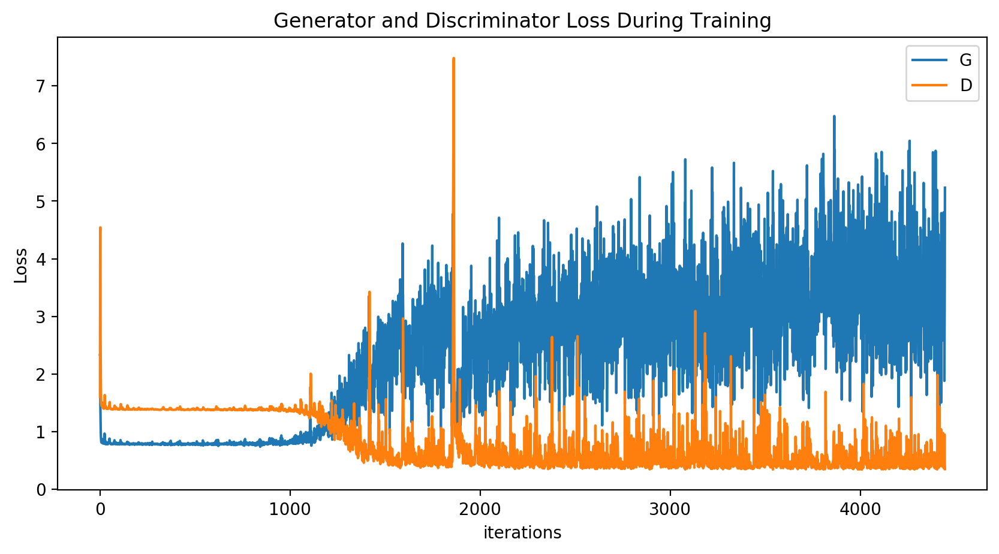

In [24]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(losses_g,label="G")
plt.plot(losses_d,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

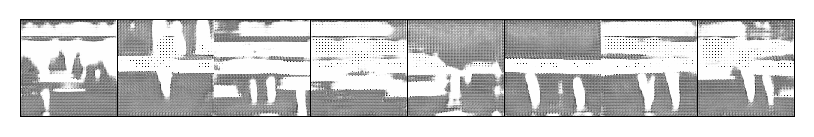

In [27]:
#%%capture
fig = plt.figure()
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in intermediate_images]
ani = animation.ArtistAnimation(fig, ims, interval=500, repeat_delay=500, blit=True)

HTML(ani.to_jshtml())

TypeError: Invalid shape (266, 2093, 18) for image data

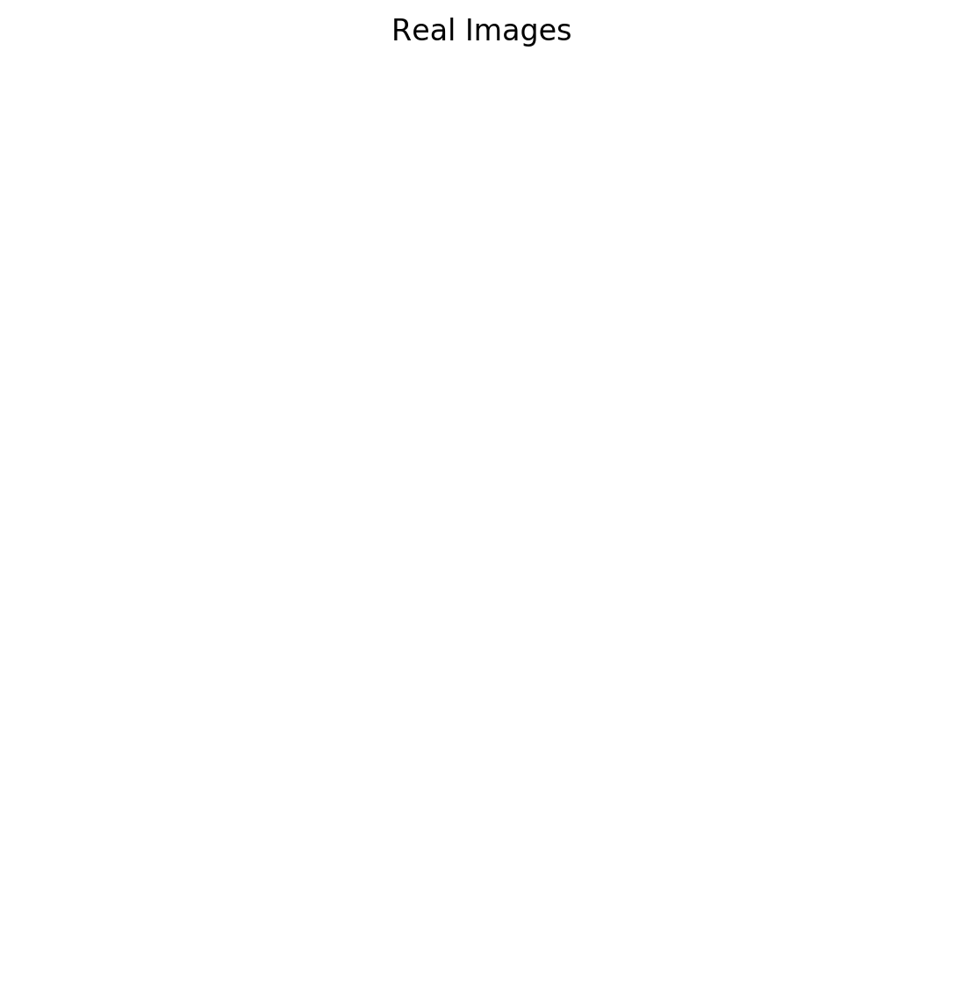

In [29]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(trainloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()